<a href="https://colab.research.google.com/github/rashmi-22-stack/Final_Assignment/blob/main/Final_assignment_CO2_emissions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [111]:
# import packages
import pandas as pd
from google.colab import files
from google.colab import data_table
data_table.enable_dataframe_formatter()
from scipy import stats
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

**Question:1.
What is the biggest predictor of a large CO2 output per capita of a country?

->-> Answer can be a specific combination of certain factors.

In [112]:
# grabing raw file from github containing all required datas from website_page_link:'https://ourworldindata.org/co2-dataset-sources'
raw_github_link= 'https://github.com/owid/co2-data/raw/master/owid-co2-data.csv'

# open csv file
df= pd.read_csv(raw_github_link)
# just see data table
df

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,...,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share
0,Afghanistan,1850,AFG,3752993.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1851,AFG,3767956.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.165,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
2,Afghanistan,1852,AFG,3783940.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.164,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
3,Afghanistan,1853,AFG,3800954.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.164,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
4,Afghanistan,1854,AFG,3818038.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.163,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50593,Zimbabwe,2017,ZWE,14751101.0,2.194784e+10,0.469,0.032,9.596,-0.937,-8.899,...,NaN,0.114,0.001,0.001,0.002,0.0,115.59,28.30,0.910,9.486
50594,Zimbabwe,2018,ZWE,15052191.0,2.271535e+10,0.558,0.037,11.795,2.199,22.920,...,NaN,0.114,0.001,0.001,0.002,0.0,118.22,30.83,0.771,6.537
50595,Zimbabwe,2019,ZWE,15354606.0,NaN,0.570,0.037,11.115,-0.681,-5.772,...,NaN,0.113,0.001,0.001,0.002,0.0,117.96,30.53,0.978,8.795
50596,Zimbabwe,2020,ZWE,15669663.0,NaN,0.570,0.036,10.608,-0.507,-4.559,...,NaN,0.112,0.001,0.001,0.002,0.0,NaN,NaN,1.006,9.481


In [113]:
# let's having columns on one place for quick view for selecting or quiting out of them easily
df.columns
# # let's get some info about data
# df.info
# # now i want for columns
# df.describe()
# # quickely see rows and columns
# df.shape
# df.dtypes
# # most important na values
df.isna().sum()

country                            0
year                               0
iso_code                        8456
population                     10590
gdp                            36034
                               ...  
temperature_change_from_n2o    12978
total_ghg                      44449
total_ghg_excluding_lucf       44449
trade_co2                      46339
trade_co2_share                46340
Length: 79, dtype: int64

 <font color='orange'>Step-1.First of all taking a look on annual CO2 Emission by each Country over the Years.</font>

In [114]:
# selecting columns
df_co2= df[['country', 'year','co2']]

<font color='lightgreen'>*In Chart each line shows each country data over time.You can hover over lines to see more details; eg. how they change over years.</font>



In [115]:
# Create an interactive line chart
fig = px.line(df_co2, x='year', y='co2', color='country', title='CO2 Emissions by Year')
fig.update_xaxes(title_text='Year')
fig.update_yaxes(title_text='CO2 Emissions')
fig.show()

<font color='orange'>* OECD and Non-OECD countries :

*  OECD -The Organisation for Economic Co-operation and Development (OECD) is an international organisation in which governments work together for global Economic Co-operation and Development to promote better policies for better lives.

*  Non-OECD -Country means a country that is not a member of the Organisation for Economic Co-operation and Development.

* As of my knowledge cutoff date in September 2021, here's a list of OECD member countries:

Australia,
Austria,
Belgium,
Canada,
Chile,
Czech Republic,
Denmark,
Estonia,
Finland,
France,
Germany,
Greece,
Hungary,
Iceland,
Ireland,
Israel,
Italy,
Japan,
South Korea,
Latvia,
Lithuania,
Luxembourg,
Mexico,
Netherlands,
New Zealand,
Norway,
Poland,
Portugal,
Slovakia,
Slovenia,
Spain,
Sweden,
Switzerland,
Turkey,
United Kingdom,
United States. </font>



 <font color='red'>--> *Let's start diving in datas. I will try to find out their Future Relation Result.*  

# **1. Checking with GDP  : -**

In [240]:
# upload world data of GDP per Capita
# upload= files.upload()
df_gdp = pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/gdp-per-capita-maddison.csv')
df_gdp

,Entity,Code,Year,GDP per capita,417485-annotations
0,Afghanistan,AFG,1950,1156.0000,NaN
1,Afghanistan,AFG,1951,1170.0000,NaN
2,Afghanistan,AFG,1952,1189.0000,NaN
3,Afghanistan,AFG,1953,1240.0000,NaN
4,Afghanistan,AFG,1954,1245.0000,NaN
...,...,...,...,...,...
19871,Zimbabwe,ZWE,2014,1594.0000,NaN
19872,Zimbabwe,ZWE,2015,1560.0000,NaN
19873,Zimbabwe,ZWE,2016,1534.0000,NaN
19874,Zimbabwe,ZWE,2017,1582.3662,NaN


In [241]:
# drop columns
df_gdp = df_gdp.drop(columns=['Code', '417485-annotations'])

In [242]:
df_gdp.isna().sum()

Entity            0
Year              0
GDP per capita    0
dtype: int64

In [243]:
df_gdp.columns

Index(['Entity', 'Year', 'GDP per capita'], dtype='object')

In [244]:
# Create an interactive line chart
fig = px.line(df_gdp, x='Year', y='GDP per capita', color='Entity', title='GDP per capita by Year')

fig.update_xaxes(title_text='Year', range=[1900, 2025])
fig.update_yaxes(title_text='GDP per capita')

# Set the dimensions of the chart
fig.update_layout(width=1000, height=800)  # Adjust width and height as needed
fig.show()

--> Interactive chart shows the gross domestic product of each country. with the help of  moving hover on lines we can see gdp with its country name. chart shows over years how and which country has raised its gdp.

In [253]:
# concancnate two data
df1 = df[['country', 'year', 'co2_per_capita']]

# Concatenate df1 and df2 along the rows (axis=0)
df2 = pd.concat([df_gdp, df1], axis=0)
df2

,Entity,Year,GDP per capita,country,year,co2_per_capita
0,Afghanistan,1950.0,1156.0,NaN,NaN,NaN
1,Afghanistan,1951.0,1170.0,NaN,NaN,NaN
2,Afghanistan,1952.0,1189.0,NaN,NaN,NaN
3,Afghanistan,1953.0,1240.0,NaN,NaN,NaN
4,Afghanistan,1954.0,1245.0,NaN,NaN,NaN
...,...,...,...,...,...,...
50593,NaN,NaN,NaN,Zimbabwe,2017.0,0.651
50594,NaN,NaN,NaN,Zimbabwe,2018.0,0.784
50595,NaN,NaN,NaN,Zimbabwe,2019.0,0.724
50596,NaN,NaN,NaN,Zimbabwe,2020.0,0.677


In [254]:
df2.columns

Index(['Entity', 'Year', 'GDP per capita', 'country', 'year',
       'co2_per_capita'],
      dtype='object')

In [255]:
# rename column
df2 = df2.rename(columns={'GDP per capita': 'gdp_per_capita'}, inplace=True)

In [261]:
# Now  fill missing values
df2['year'].fillna(df2['Year'], inplace=True)
df2['Entity'].fillna(df2['country'], inplace=True)

In [262]:
df2.isna().sum()

Entity                0
Year                  0
GDP per capita    50598
country           19876
year                  0
co2_per_capita    43559
dtype: int64

In [263]:
# Using Linear interpolation
# fill missing values using linear interpolation
df2['Year'].interpolate(method='linear', inplace=True)
df2['GDP per capita'].interpolate(method='linear', inplace=True)
df2['co2_per_capita'].interpolate(method='linear', inplace=True)

In [264]:
# checking again
df2.isna().sum()

Entity                0
Year                  0
GDP per capita        0
country           19876
year                  0
co2_per_capita    19975
dtype: int64

In [265]:
# drop same column
df2.drop(columns='year', inplace =True)

In [266]:
# still remained with some missing values
#  looking  inside  the data
df2

,Entity,Year,GDP per capita,country,co2_per_capita
0,Afghanistan,1950.0,1156.0000,NaN,NaN
1,Afghanistan,1951.0,1170.0000,NaN,NaN
2,Afghanistan,1952.0,1189.0000,NaN,NaN
3,Afghanistan,1953.0,1240.0000,NaN,NaN
4,Afghanistan,1954.0,1245.0000,NaN,NaN
...,...,...,...,...,...
50593,Zimbabwe,2018.0,1611.4052,Zimbabwe,0.651
50594,Zimbabwe,2018.0,1611.4052,Zimbabwe,0.784
50595,Zimbabwe,2018.0,1611.4052,Zimbabwe,0.724
50596,Zimbabwe,2018.0,1611.4052,Zimbabwe,0.677


In [267]:
# Fill missing values in 'Entity' with values from 'country' when 'Entity' is NaN
df2['Entity'].fillna(df2['country'], inplace=True)

# Drop the 'country' column as no longer need it
df2.drop(columns=['country'], inplace=True)

In [268]:
df2.isna().sum()

Entity                0
Year                  0
GDP per capita        0
co2_per_capita    19975
dtype: int64

In [269]:
#  impute those values with median
df2['co2_per_capita'].fillna(method='bfill', inplace=True)

In [270]:
# checking na values again
df2.isna().sum()

Entity            0
Year              0
GDP per capita    0
co2_per_capita    0
dtype: int64

<ipython-input-271-0b10dbbafbdd>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



                    Year  GDP per capita  co2_per_capita
Year            1.000000        0.013342        0.061886
GDP per capita  0.013342        1.000000       -0.044689
co2_per_capita  0.061886       -0.044689        1.000000


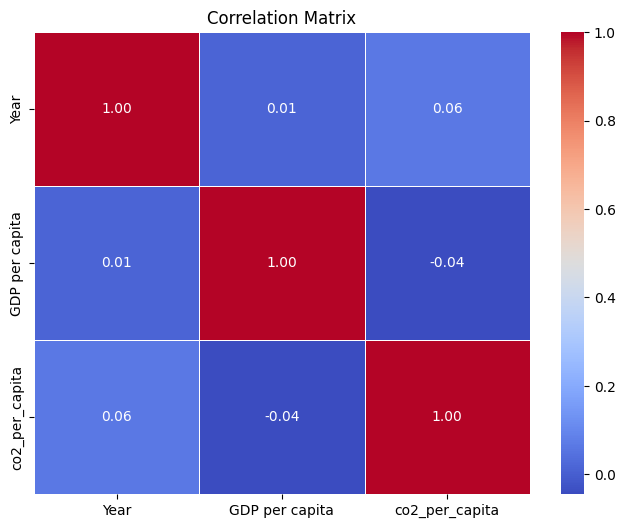

In [271]:
# calculating correlation between them
correlation_matrix= df2.corr()
print (correlation_matrix)

# Create a heatmap
plt.figure(figsize=(8, 6))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()


-->  Map shows not a warm relation between co2 emission and gdp per capita.

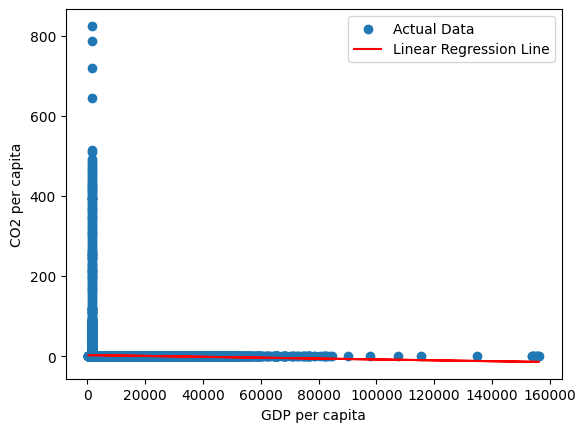

In [273]:
# LinearRegression Analysis
## Import the LinearRegression model from scikit-learn

X = df2['GDP per capita'].values.reshape(-1, 1)
y = df2['co2_per_capita'].values

# Create and fit a linear regression model
model = LinearRegression()
model.fit(X, y)

# Make predictions
y_pred = model.predict(X)

# Visualize the data and the regression line
plt.scatter(X, y, label='Actual Data')
plt.plot(X, y_pred, color='red', label='Linear Regression Line')
plt.xlabel('GDP per capita')
plt.ylabel('CO2 per capita')
plt.legend()
plt.show()

<font color='ligblue'>* In simpler terms, the R-squared value of 0.000 suggests that there is no significant linear correlation between a country's GDP and its CO2 emissions per capita in this world dataset. This means that changes in CO2 emissions per capita do not predict or explain changes in GDP per capita or vice versa, at least according to the linear regression model.

<font color='lightgreen'>But it can vary for the countries with high income than  the countries with low income . Usualy humans by nature spend more on living facilities eg. cars, airco, more frequent vacations, and other Electronic equipment , food , and more wastage of all these also , etc. to raise their living standard and comfort . All these may also responsible to increase CO2 of that country.
But  how much or how far? For that ofcourse there is need to deep seen in Datas from High Income countries, Upper middle Income countries, and low income countries.**</font>

#* **2. Checking Various Energy Sources : -**

<font color='yellow'> * Co2 Emission are dominated by the burning of Fossil fuels for Energy Production and for Industrial Production.

In [228]:
# selecting columns for energy
df_energy= df[['country', 'year', 'co2', 'cement_co2_per_capita','coal_co2_per_capita', 'gas_co2_per_capita','methane_per_capita', 'nitrous_oxide_per_capita', 'oil_co2_per_capita', 'other_co2_per_capita']]

,country,year,co2,cement_co2_per_capita,coal_co2_per_capita,gas_co2_per_capita,methane_per_capita,nitrous_oxide_per_capita,oil_co2_per_capita,other_co2_per_capita
0,False,False,True,True,True,True,True,True,True,True
1,False,False,True,True,True,True,True,True,True,True
2,False,False,True,True,True,True,True,True,True,True
3,False,False,True,True,True,True,True,True,True,True
4,False,False,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...,...
50593,False,False,False,False,False,False,False,False,False,True
50594,False,False,False,False,False,False,False,False,False,True
50595,False,False,False,False,False,False,False,False,False,True
50596,False,False,False,False,False,False,True,True,False,True


In [230]:
df_energy.isna().sum()
# df_energy.isna()

country                         0
year                            0
co2                         19249
cement_co2_per_capita       27884
coal_co2_per_capita         26177
gas_co2_per_capita          26258
methane_per_capita          44448
nitrous_oxide_per_capita    44448
oil_co2_per_capita          26231
other_co2_per_capita        48212
dtype: int64

In [231]:
# interpolate data
df_energy['year'].interpolate(method='linear', inplace=True)
df_energy['co2'].interpolate(method='linear', inplace=True)
df_energy['cement_co2_per_capita'].interpolate(method='linear', inplace=True)
df_energy['coal_co2_per_capita'].interpolate(method='linear', inplace=True)
df_energy['gas_co2_per_capita'].interpolate(method='linear', inplace=True)
df_energy['methane_per_capita'].interpolate(method='linear', inplace=True)
df_energy['nitrous_oxide_per_capita'].interpolate(method='linear', inplace=True)
df_energy['oil_co2_per_capita'].interpolate(method='linear', inplace=True)
df_energy['other_co2_per_capita'].interpolate(method='linear', inplace=True)

<ipython-input-231-69d7fa217111>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-231-69d7fa217111>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-231-69d7fa217111>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-231-69d7fa217111>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/

In [232]:
df_energy.isna().sum()

country                        0
year                           0
co2                           99
cement_co2_per_capita         99
coal_co2_per_capita           99
gas_co2_per_capita            99
methane_per_capita           140
nitrous_oxide_per_capita     140
oil_co2_per_capita            99
other_co2_per_capita        2992
dtype: int64

In [233]:
columns_to_fill = ['co2', 'cement_co2_per_capita', 'coal_co2_per_capita', 'gas_co2_per_capita', 'methane_per_capita', 'nitrous_oxide_per_capita', 'oil_co2_per_capita', 'other_co2_per_capita']

# Fill missing values with the mean of each respective column
for column in columns_to_fill:
    mean_value = df_energy[column].mean()
    df_energy[column].fillna(mean_value, inplace=True)

<ipython-input-233-3d574bedfd17>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [165]:
# # Forward fill method to fill missing values
# df_energy['co2'].fillna(method='bfill', inplace=True)
# df_energy['cement_co2_per_capita'].fillna(method='bfill', inplace=True)
# df_energy['coal_co2_per_capita'].fillna(method='bfill', inplace=True)
# df_energy['gas_co2_per_capita'].fillna(method='bfill', inplace=True)
# df_energy['methane_per_capita'].fillna(method='bfill', inplace=True)
# df_energy['nitrous_oxide_per_capita'].fillna(method='bfill', inplace=True)
# df_energy['oil_co2_per_capita'].fillna(method='bfill', inplace=True)
# df_energy['other_co2_per_capita'].fillna(method='bfill', inplace=True)

<ipython-input-165-9ef79ff5c867>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-165-9ef79ff5c867>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-165-9ef79ff5c867>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-165-9ef79ff5c867>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/

In [234]:
df_energy.isna().sum()

country                     0
year                        0
co2                         0
cement_co2_per_capita       0
coal_co2_per_capita         0
gas_co2_per_capita          0
methane_per_capita          0
nitrous_oxide_per_capita    0
oil_co2_per_capita          0
other_co2_per_capita        0
dtype: int64

In [235]:
# correlation: CO2 vs. Energy sources
print(df_energy.corr())

                              year       co2  cement_co2_per_capita  \
year                      1.000000  0.079929               0.105282   
co2                       0.079929  1.000000               0.139563   
cement_co2_per_capita     0.105282  0.139563               1.000000   
coal_co2_per_capita       0.100575  0.146903               0.298240   
gas_co2_per_capita        0.013842  0.048760               0.306709   
methane_per_capita       -0.003366 -0.030496               0.066529   
nitrous_oxide_per_capita  0.004541  0.024745               0.032291   
oil_co2_per_capita        0.027192 -0.004881               0.012212   
other_co2_per_capita      0.057185 -0.075539               0.097454   

                          coal_co2_per_capita  gas_co2_per_capita  \
year                                 0.100575            0.013842   
co2                                  0.146903            0.048760   
cement_co2_per_capita                0.298240            0.306709   
coal_co2_per_

<ipython-input-235-7e23ba978871>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



 -->>* The Result shows that correlation between CO2 and the Other Energy sources. results are less than 0.5 Means no specificly strong relation per capita basis.. In normal language, more usage of such kind of energy sources definitely increase the CO2. But per capita it not shows strong relation . Causes can be vary from global co2 emission vs. energy .

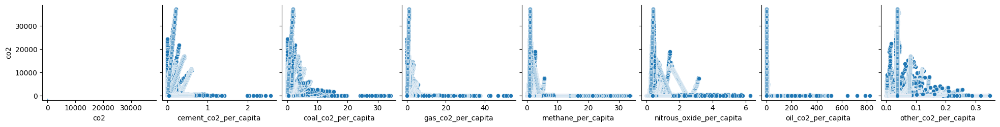

In [236]:
# visualising their relation
# individual chart for co2 vs. energy source
import seaborn as sns
sns.pairplot(df_energy, x_vars=['co2', 'cement_co2_per_capita',
       'coal_co2_per_capita', 'gas_co2_per_capita', 'methane_per_capita',
       'nitrous_oxide_per_capita', 'oil_co2_per_capita',
       'other_co2_per_capita'], y_vars=['co2'])


In [239]:
# visualising Regression
# Define the variables
x_vars = ['cement_co2_per_capita',
       'coal_co2_per_capita', 'gas_co2_per_capita', 'methane_per_capita',
       'nitrous_oxide_per_capita', 'oil_co2_per_capita',
       'other_co2_per_capita']
y_var = 'co2'

# Create an interactive scatter plot with regression lines
fig = px.scatter(df_energy, x=x_vars[0], y=y_var, trendline='ols', title=f'Regression: {y_var} vs. {x_vars[0]}')
for var in x_vars[1:]:
    fig.add_trace(px.scatter(df_energy, x=var, y=y_var, trendline='ols', title=f'Regression: {y_var} vs. {var}').data[1])

# Update axis labels
fig.update_xaxes(title_text='Energy Sources')
fig.update_yaxes(title_text='CO2 Emissions')

# Set the chart title
fig.update_layout(title='CO2 Emission vs. Various Energy Sources')

# Show the interactive chart
fig.show()



<font color='yellow'>--> *  This interactive chart shows the future of CO2 emissions from coal, oil, gas and cement. Individual Regression lines to shows clearly how each is changing over time.

--> The Coal will be the  most responsible for CO2 Emission if in the same way going in future. But it can be vary for rich countries and for poor countries where per capita income is different.</font>

 # **3. Check for Food : -**
<font color='lightblue'>** GHG known as Greenhouse gases. Some of the earth's  heat is trapped by the greenhouse gases in the atmosphere.

-> Greenhouse gas emissions are measured in carbon dioxide-equivalents (CO₂eq) per kilogram
of food.

In [180]:
df_food= pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/food-emissions-supply-chain%20(1).csv')

# check nan
df_food.isna().sum()

Entity                         0
Code                          43
Year                           0
food_emissions_land_use        0
food_emissions_farm            0
food_emissions_animal_feed     0
food_emissions_processing      0
food_emissions_transport       0
food_emissions_retail          0
food_emissions_packaging       0
food_emissions_losses          0
dtype: int64

In [181]:
# drop column
df_food = df_food.drop(columns=['Code'])
# df_food.columns

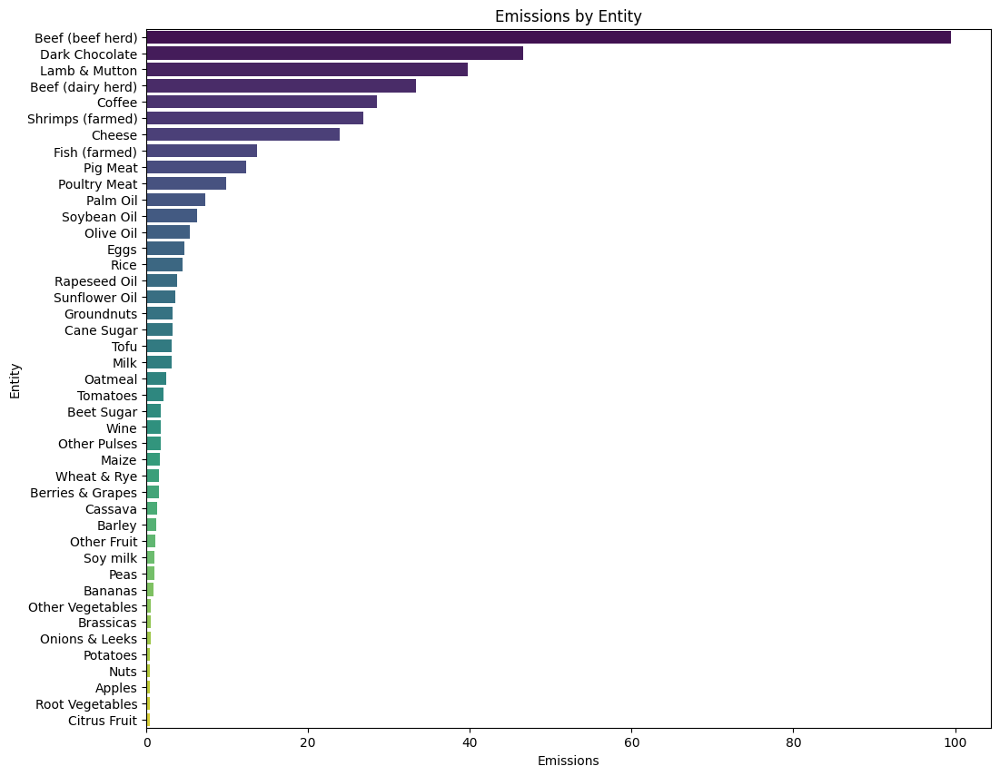

In [182]:
# sum the Emission for each Entity
entity_emissions  = df_food[['food_emissions_land_use', 'food_emissions_farm',
       'food_emissions_animal_feed', 'food_emissions_processing',
       'food_emissions_transport', 'food_emissions_retail',
       'food_emissions_packaging', 'food_emissions_losses']].sum(axis=1)

#  aggregate the data by entity
entity_emissions =pd.DataFrame({'Entity':df_food['Entity'], 'Emissions':entity_emissions })

entity_emissions= entity_emissions.groupby('Entity')['Emissions'].sum()

# Sort the entities by emissions (optional)
entity_emissions = entity_emissions.sort_values(ascending=False)

# Create a bar plot using Seaborn
plt.figure(figsize=(12, 10))
sns.barplot(x=entity_emissions.values, y=entity_emissions.index, palette='viridis')

# Set labels and title
plt.xlabel('Emissions')
plt.ylabel('Entity')
plt.title('Emissions by Entity')

# Show the plot
plt.show()


<font color='lightgreen'>--> * Looks like that Meat and Dairy herd are in TOP 5 from list of Food in releasing CO2 / GHG in environment.
* **Let's try to more explore by understanding the data.*

<ipython-input-183-ffa75fa23988>:4: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



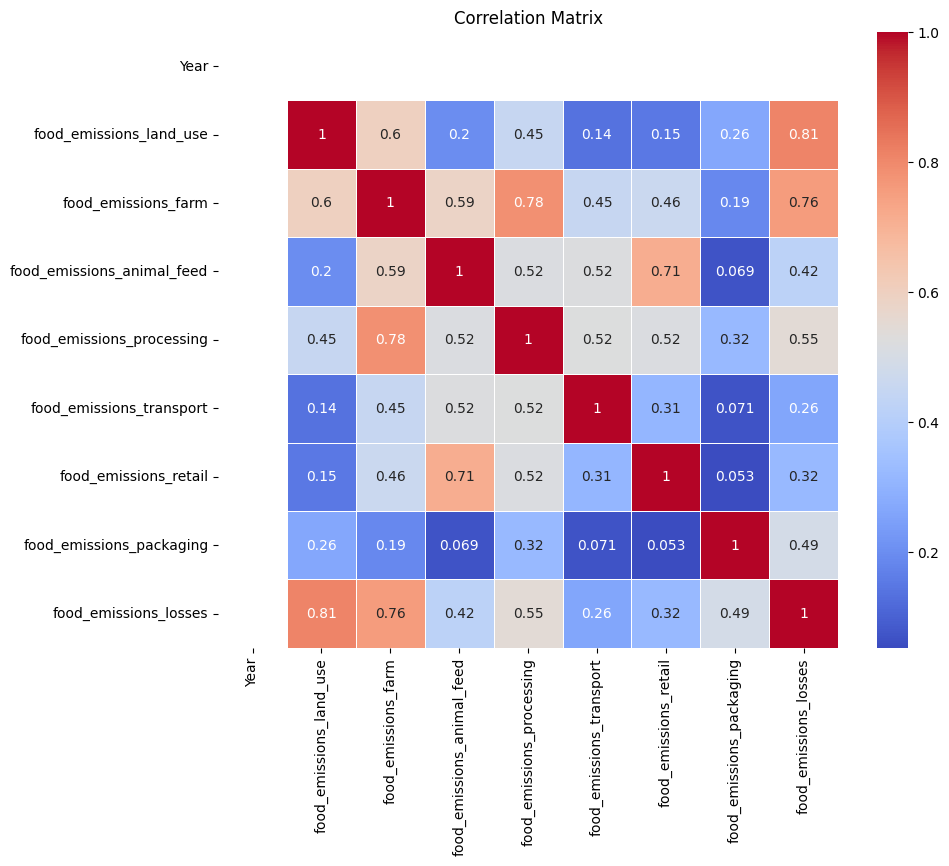

In [183]:
# visualising correlation by Heatmap

# Calculate the correlation matrix
correlation = df_food.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix')
plt.show()


<font color='lightgreen'>-->> Looking at HeatMap of correlation between FOOD vs. GAS Emission. we see the Relation between **Land Used for FOOD** and the **GAS Emission** by them in environment . More warm color shows stronger relation and ofcourse more lighter to blue color shows less strong relation. As chart shows Most of the gas is emitted by  Food Loss , food from **Farm and their Processing**, and thirdly **Animal Feed and their Retailing**.

<font color='yellow'> --> **IN other words, Dairy and Farm are the most resposible to produce GHG . And ultimately that increase CO2 of a country . **

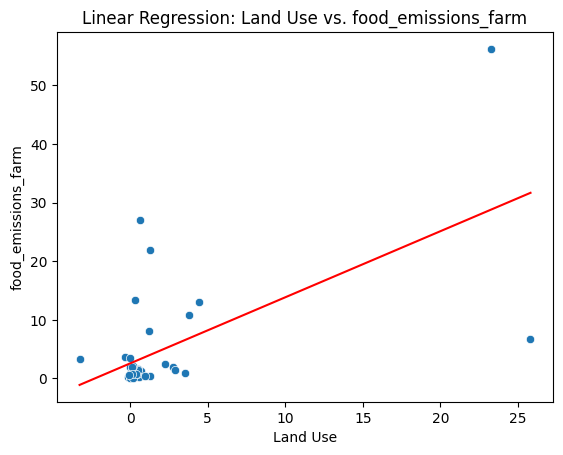

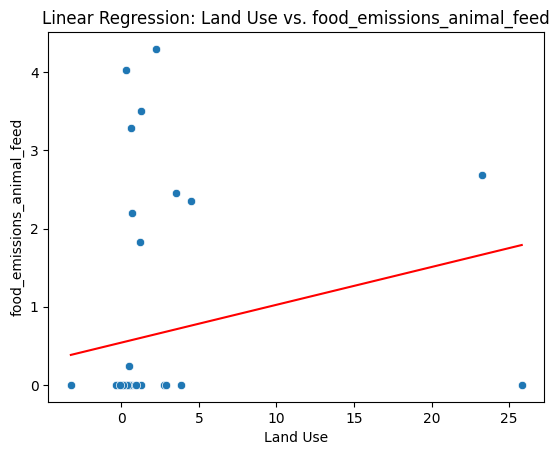

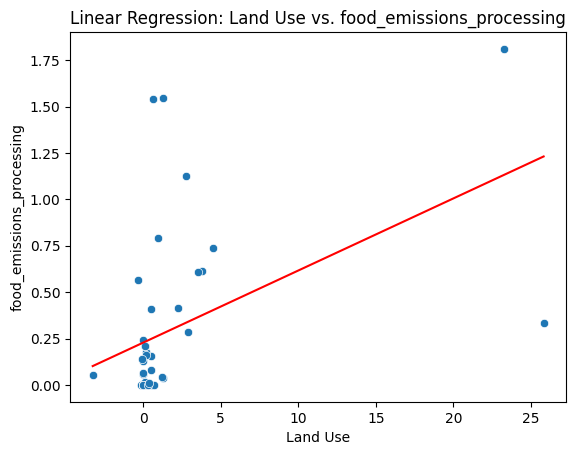

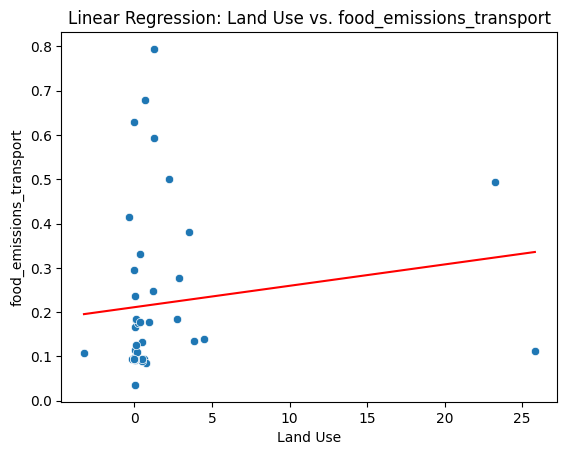

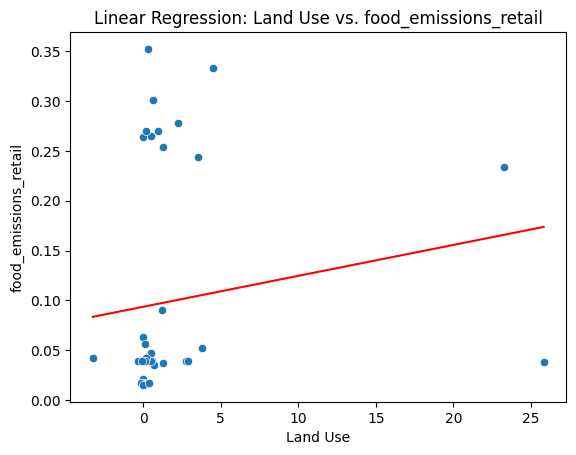

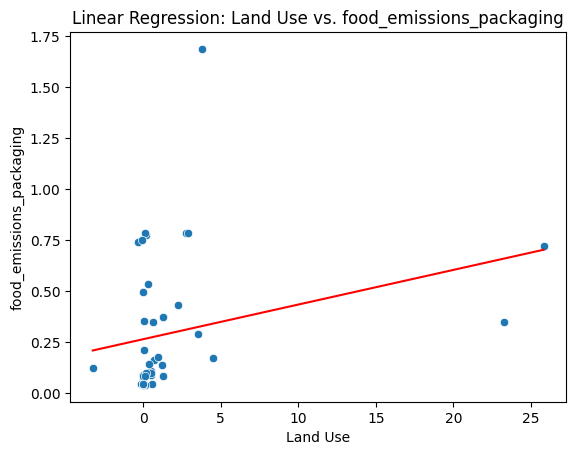

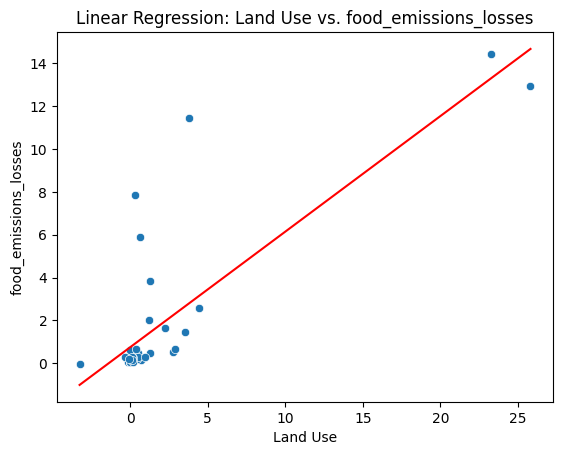

In [184]:
# perdicting effect/emission for land used by each food factor

# Select the 'food_emissions_land_use' column
land_use = df_food['food_emissions_land_use']

# Select the rest of the emission columns
emission_columns = df_food[['food_emissions_farm', 'food_emissions_animal_feed', 'food_emissions_processing',
                            'food_emissions_transport', 'food_emissions_retail',
                            'food_emissions_packaging', 'food_emissions_losses']]

# Perform linear regression for 'food_emissions_land_use' with each emission column
for column in emission_columns.columns:
    slope, intercept, r_value, p_value, std_err = stats.linregress(land_use, emission_columns[column])

    sns.scatterplot(x=land_use, y=emission_columns[column])
    plt.title(f'Linear Regression: Land Use vs. {column}')
    plt.xlabel('Land Use')
    plt.ylabel(column)
    # Define a smaller plot size
    plot_size = (4, 3)
    # Add the regression line to the plot
    sns.lineplot(x=land_use, y=intercept + slope * land_use, color='red')

    plt.show()


<font color='lightgreen'>* Beyond GreenHouse Gases, Food production can lead to environmental losses such as deforestation, soil degradation, and water pollution. These losses are associated with clearing land for agriculture, excessive fertilizer use, and pesticide runoff. Food production can also lead to habitat loss and a decrease in biodiversity due to land conversion for farming.

<font color='lightgreen'>** By analyzing the Data; I found that 'Food' emission losses have the most significant impact on climate change and that 'Farm' activities, regardless of their specific use, are contributing to increased CO2/GHG emissions whether they are used for Agriculture or for Dairy or for Meat.

#4. **Checking for Population** : -

In [185]:
# selecting columns to work
df1 = df[['country', 'year', 'population', 'co2']]

# counting Nan values if any
df1.isna().sum()

country           0
year              0
population    10590
co2           19249
dtype: int64

*(Linear interpolation calculates the missing values by drawing a straight line between two adjacent data points and estimating the values along that line.)

*(This is a useful technique for time series data because it helps maintain a smoother and more continuous representation of a data, which can be important for various time-based analyses.)

In [186]:
# Using Linear interpolation
# Filling missing values with 'linear' method in the 'population' column
df1['population'].interpolate(method='linear', inplace=True)

# Check for NaN values in the 'population' column
nan_count = df1['population'].isna().sum()

print("Number of NaN values in the 'population' column:", nan_count)


Number of NaN values in the 'population' column: 0


<ipython-input-186-f1649a2e1a93>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [187]:
# getting correlation between the columns
print(df1.corr())

                year  population       co2
year        1.000000   -0.005992  0.146814
population -0.005992    1.000000  0.566925
co2         0.146814    0.566925  1.000000


<ipython-input-187-4fce857c3034>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



--->>  Result shows CO2 and Population has 0.5669... i.e. close to 0.6 which is likely is a good relation . Means if population increases the CO2 emission increases too. ---> *Now let's see the Perdiction by help of a chart whether Population can impact Emission of CO2 in the future .

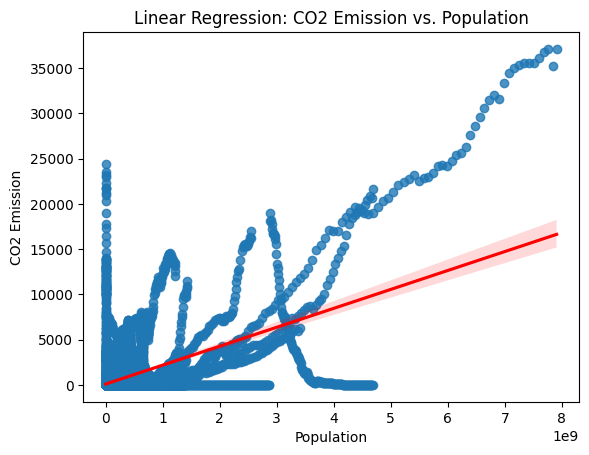

In [188]:
# calculating LinearRegression
# plot scatter graph with regression line
sns.regplot(x='population', y='co2', data=df1, line_kws={'color':'red'})

plt.xlabel('Population')
plt.ylabel('CO2 Emission')
plt.title('Linear Regression: CO2 Emission vs. Population')
plt.show()

--->> Clearly Regression Line in Red color goes up in chart shows as Population grows over years then CO2 Emission will also raise in Future.



#Question 1. What is the biggest predictor of a large CO2 output per capita of a country?

 Answer 1. <font color='yellow'>*My conclusion after anaysing above datas is Food and Population can equally be the biggest perdictor for Emitting CO2 output of a country. Food likely be the biggest all of them because data shows very significant relation with Co2 Emission.

Question 2. **Which countries are making the biggest strides in decreasing CO2 output?**

To stabilize (or even reduce) concentrations of CO2 in the atmosphere, the world needs to reach net-zero emissions. This requires large and fast reductions in emissions.

The target year to reach net zero varies by country.
Note that the inclusion criteria may vary from country to country. For example, some countries may include international aviation and shipping in their net-zero commitment, while others do not. Or, some may allow for carbon offsets while others will not accept them.

In [190]:
# data_net_zero= pd.read_excel('data.xlsx')
# data of countries change co2 emission and gdp
countries_strides= pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/co2-emissions-and-gdp.csv')
countries_strides.columns

Index(['Entity', 'Code', 'Year', 'GDP, PPP (constant 2017 international $)',
       'Annual CO₂ emissions', 'Annual consumption-based CO₂ emissions'],
      dtype='object')

In [191]:
countries_strides.isna().sum()

Entity                                         0
Code                                        1181
Year                                           0
GDP, PPP (constant 2017 international $)    1935
Annual CO₂ emissions                         362
Annual consumption-based CO₂ emissions      3681
dtype: int64

In [192]:
# interpolate na values
countries_strides['GDP, PPP (constant 2017 international $)'].interpolate(method='linear', inplace=True)
countries_strides['Annual CO₂ emissions'].interpolate(method='linear', inplace=True)
countries_strides['Annual consumption-based CO₂ emissions'].interpolate(method='linear', inplace=True)


In [193]:
countries_strides.isna().sum()

Entity                                         0
Code                                        1181
Year                                           0
GDP, PPP (constant 2017 international $)      12
Annual CO₂ emissions                           0
Annual consumption-based CO₂ emissions        32
dtype: int64

In [196]:
# Calculate the mean of the respective columns
mean_gdp = countries_strides['GDP, PPP (constant 2017 international $)'].mean()
mean_co2_emissions = countries_strides['Annual CO₂ emissions'].mean()
mean_consumption_based_co2 = countries_strides['Annual consumption-based CO₂ emissions'].mean()

# Fill missing values with the mean
countries_strides['GDP, PPP (constant 2017 international $)'].fillna(mean_gdp, inplace=True)
countries_strides['Annual CO₂ emissions'].fillna(mean_co2_emissions, inplace=True)
countries_strides['Annual consumption-based CO₂ emissions'].fillna(mean_consumption_based_co2, inplace=True)

<ipython-input-198-42cce8805716>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-198-42cce8805716>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



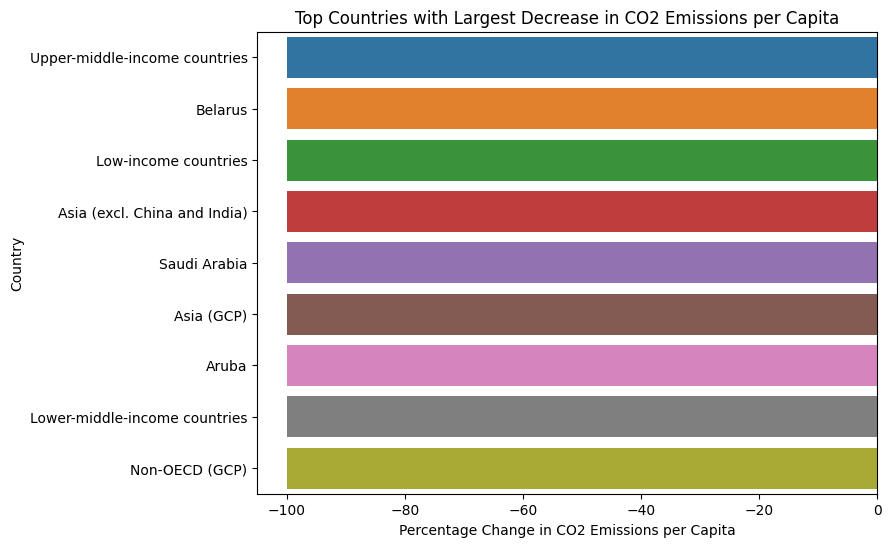

In [198]:
# Calculate the percentage change in CO2 emissions per capita for each country over time:
df1['CO2_per_capita'] = df1['co2'] / df1['population']
df1['CO2_per_capita_change'] = df1.groupby('country')['CO2_per_capita'].pct_change() * 100

# Sort the data by the largest percentage change in decreasing CO2 emissions per capita:
sorted_data = df1.sort_values(by='CO2_per_capita_change', ascending=True)

# Select the top countries with the most significant decreases in CO2 emissions per capita, accounting for population growth.
top_countries = sorted_data.head(10)

# Visualize the results using seaborn.
plt.figure(figsize=(8, 6))
sns.barplot(x='CO2_per_capita_change', y='country', data=top_countries)
plt.xlabel('Percentage Change in CO2 Emissions per Capita')
plt.ylabel('Country')
plt.title('Top Countries with Largest Decrease in CO2 Emissions per Capita')
plt.show()

--> Changes in population can influence CO2 emissions per capita. To account for population growth while identifying countries that are making the biggest strides in decreasing CO2 output.

In [219]:
# countries declining with co2 output  Net zerocontract achieved already
net_zero_co2= pd.read_excel('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/data%20(1).xlsx')
net_zero_co2

,last_updated,id_code,name,country,geographic_region,actor_type,race_to_zero_member,end_target,end_target_year,end_target_status,...,max_emission_offset,end_target_other,end_target_baseline_emissions,end_target_intensity_unit,isin_id,website,annual_revenue,industry,employees,sector
0,2022-05-28 08:07:58,COU-0001,Afghanistan,AFG,Western and Central Asia,Country,No,Net zero,2050.0,Proposed / in discussion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-05-31 13:40:37,COU-0002,Angola,AGO,Africa,Country,No,Net zero,2050.0,Proposed / in discussion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022-06-01 14:07:34,COU-0003,Argentina,ARG,Latin America and the Caribbean,Country,No,Net zero,2050.0,In policy document,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023-05-15 19:40:32,COU-0004,Armenia,ARM,Western and Central Asia,Country,No,Net zero,2050.0,Proposed / in discussion,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2022-05-24 23:25:32,COU-0005,Antigua and Barbuda,ATG,Latin America and the Caribbean,Country,No,Net zero,2040.0,In policy document,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4065,2022-12-29 05:52:42,COM-1997,SEB SA,FRA,Europe,Company,No,Carbon neutral(ity),2050.0,In corporate strategy,...,NaN,NaN,NaN,NaN,FR0000121709,http://www.groupeseb.com,7.900000e+09,Services,NaN,NaN
4066,2022-12-26 07:39:57,COM-1998,ENEOS Holdings,JPN,East Asia,Company,No,Carbon neutral(ity),2040.0,In corporate strategy,...,NaN,NaN,NaN,NaN,JP3386450005,https://www.hd.eneos.co.jp/english/,7.280000e+10,Fossil Fuels,NaN,NaN
4067,2021-10-23 11:15:46,COM-1999,Secom,JPN,East Asia,Company,Yes,Other,2050.0,In corporate strategy,...,NaN,"2020 onward, in an effort of minifying the use...",NaN,NaN,JP3421800008,http://www.secom.co.jp,NaN,Services,NaN,NaN
4068,2022-08-13 18:11:27,COM-2000,Prudential,GBR,Europe,Company,Yes,Net zero,2050.0,Declaration / pledge,...,NaN,NaN,NaN,NaN,GB0007099541,http://www.prudential.com,5.480000e+10,Services,NaN,NaN


In [220]:
net_zero_co2.columns

Index(['last_updated', 'id_code', 'name', 'country', 'geographic_region',
       'actor_type', 'race_to_zero_member', 'end_target', 'end_target_year',
       'end_target_status', 'status_date', 'interim_target',
       'interim_target_percentage_reduction',
       'interim_target_target_emissions', 'interim_target_bau_emissions',
       'interim_target_year', 'end_target_text', 'interim_target_text',
       'target_notes', 'source_url', 'gasses_coverage',
       'consumption_emissions', 'international_aviation',
       'international_shipping', 'scope_1', 'scope_2', 'scope_3',
       'historical_emissions', 'coverage_notes', 'has_plan',
       'reporting_mechanism', 'equity', 'accountability', 'governance_notes',
       'carbon_credit_offsets', 'removals_targets', 'cdr',
       'sinks_and_credits_notes', 'memberships', 'gdp_real', 'population',
       'ghg', 'inventory_year', 'higher_net_zero',
       'interim_target_baseline_year', 'interim_target_other',
       'territorial_emissions

In [222]:
# finding out the countries whichhave already achieved their Target of Net Zero co2 emission
# Filter the DataFrame to include only rows where 'end_target_status' is 'Achieved'
achieved_countries = net_zero_co2[net_zero_co2['end_target_status'] == 'Achieved (self-declared)']

# Extract the 'country' column from the filtered DataFrame
achieved_countries_list = achieved_countries['country'].tolist()

# Print the list of countries that have achieved their end target
print("Countries that have Achieved their end target:")
print(achieved_countries_list)


Countries that have Achieved their end target:
['BEN', 'BTN', 'COM', 'GAB', 'GUY', 'SUR', 'IND', 'CHE', 'USA', 'IND', 'USA', 'CHE', 'JPN', 'AUS', 'USA', 'USA', 'USA', 'CHE', 'TUR', 'GBR', 'DEU', 'CHE', 'USA', 'CAN', 'AUS', 'DEU', 'USA', 'JPN', 'USA', 'SGP', 'CHE', 'USA', 'ZAF', 'USA', 'USA', 'TWN', 'USA', 'USA', 'BMU', 'DEU', 'BEL', 'HKG', 'CHE', 'TWN', 'PRT', 'NLD', 'ZAF', 'USA', 'USA', 'SGP', 'USA', 'USA']


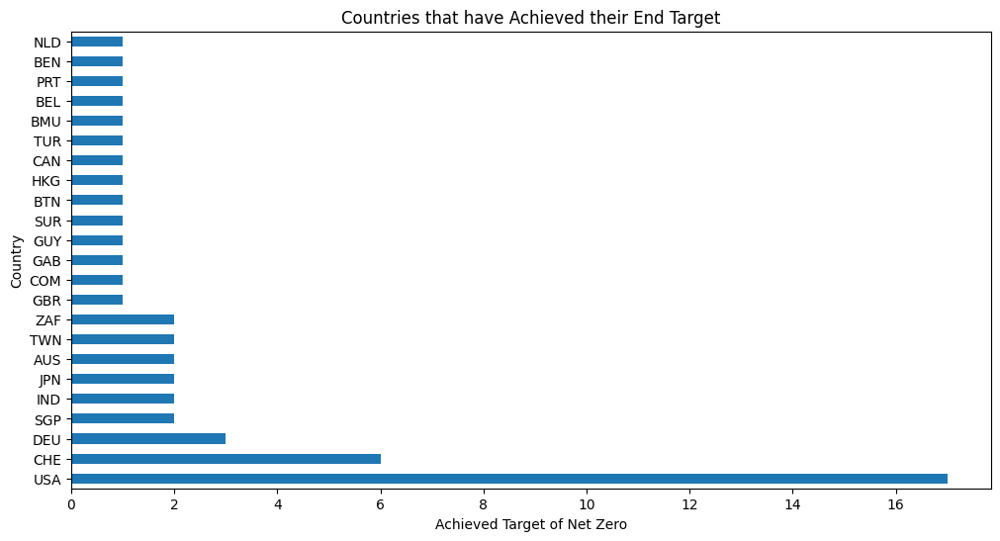

In [227]:
# Group the data by 'country' and count the occurrences
achieved_counts = achieved_countries['country'].value_counts()

# Sort the data by counts in descending order
achieved_counts = achieved_counts.sort_values(ascending=False)

# Create a bar chart
plt.figure(figsize=(12, 6))
achieved_counts.plot(kind='barh')

plt.xlabel('Achieved Target of Net Zero')
plt.ylabel('Country')
plt.title('Countries that have Achieved their End Target')
plt.show()

 A number of countries have shown in recent years declared the target of net zero co2 have already achieved. even though here already achieved does'nt prove that they don't produce co2 any more but they have declared on the particular decided year by law will  achieve the net zero end target. On basis of policies they adapt to reduce co2 eg. less use of fossil fuel, more use of non_fossil fuel etc.

# Question 3. Which Non-Fossil Fuel energy technology will have the best price in the future?

--> *<font color= 'orange'>Renewable energy = energy from hydropower, solar, wind, geothermal, wave and tidal, and bioenergy.--> Renewable energy sources include hydropower, solar, wind, geothermal, bioenergy, wave,
and tidal. They don't include traditional biofuels, which can be a key energy source,
especially in lower-income settings.

In [ ]:
# Annual percentage change in renewable energy generation, 1966 to 2022
# Share of Global primary energy consumption by source

In [199]:
# generation of non-fossil fuel by world over years
non_fossil_energy_generation= pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/modern-renewable-prod.csv')
non_fossil_energy_generation.columns

Index(['Entity', 'Code', 'Year', 'Electricity from wind (TWh)',
       'Electricity from hydro (TWh)', 'Electricity from solar (TWh)',
       'Other renewables including bioenergy (TWh)'],
      dtype='object')

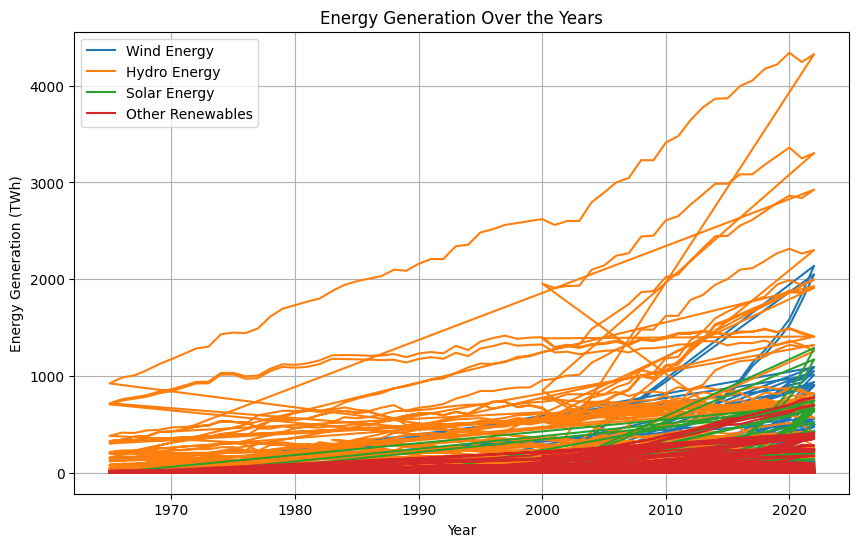

In [200]:
# Extract the relevant columns for energy generation and years
years = non_fossil_energy_generation['Year']
wind_energy = non_fossil_energy_generation['Electricity from wind (TWh)']
hydro_energy = non_fossil_energy_generation['Electricity from hydro (TWh)']
solar_energy = non_fossil_energy_generation['Electricity from solar (TWh)']
other_renewables = non_fossil_energy_generation['Other renewables including bioenergy (TWh)']

# Create a figure and plot the data
plt.figure(figsize=(10, 6))
plt.plot(years, wind_energy, label='Wind Energy')
plt.plot(years, hydro_energy, label='Hydro Energy')
plt.plot(years, solar_energy, label='Solar Energy')
plt.plot(years, other_renewables, label='Other Renewables')
plt.xlabel('Year')
plt.ylabel('Energy Generation (TWh)')
plt.title('Energy Generation Over the Years')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

** Chart shows that Hydro power energy is the most generated in previous years and most now a days also. Then wind energy generation has increased from recent years. After that is Solar energy. these are likely the top 3 non_fossil fuel produced from recent years and is still they are gaining .

In [201]:
# global annual energy consumption
global_consumption= pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/global-energy-substitution.csv')
global_consumption.columns

Index(['Entity', 'Code', 'Year', 'Other renewables (TWh, substituted energy)',
       'Biofuels (TWh, substituted energy)', 'Solar (TWh, substituted energy)',
       'Wind (TWh, substituted energy)',
       'Hydropower (TWh, substituted energy)',
       'Nuclear (TWh, substituted energy)', 'Gas (TWh, substituted energy)',
       'Oil (TWh, substituted energy)', 'Coal (TWh, substituted energy)',
       'Traditional biomass (TWh, substituted energy)'],
      dtype='object')

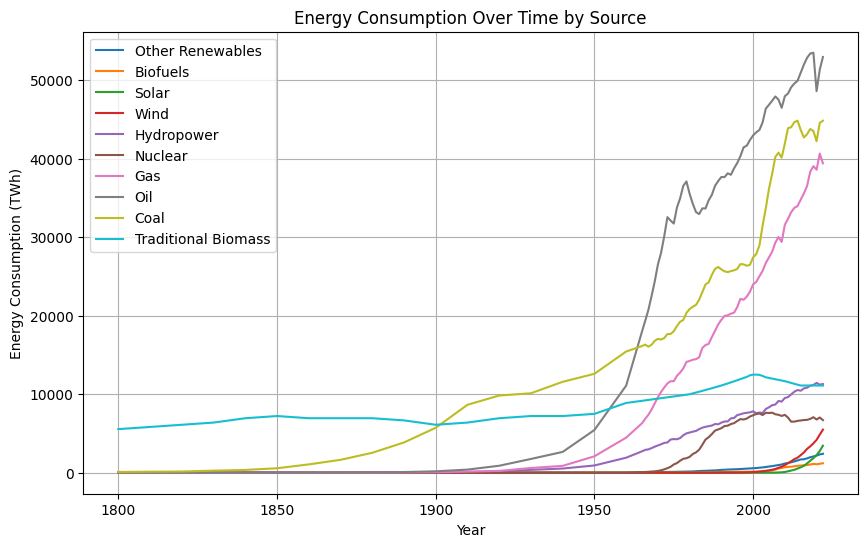

In [202]:
# visualising
# Extract the relevant columns for energy consumption and years
years = global_consumption['Year']
other_renewables = global_consumption['Other renewables (TWh, substituted energy)']
biofuels = global_consumption['Biofuels (TWh, substituted energy)']
solar = global_consumption['Solar (TWh, substituted energy)']
wind = global_consumption['Wind (TWh, substituted energy)']
hydropower = global_consumption['Hydropower (TWh, substituted energy)']
nuclear = global_consumption['Nuclear (TWh, substituted energy)']
gas = global_consumption['Gas (TWh, substituted energy)']
oil = global_consumption['Oil (TWh, substituted energy)']
coal = global_consumption['Coal (TWh, substituted energy)']
biomass = global_consumption['Traditional biomass (TWh, substituted energy)']

# Create a figure and plot the data
plt.figure(figsize=(10, 6))
plt.plot(years, other_renewables, label='Other Renewables')
plt.plot(years, biofuels, label='Biofuels')
plt.plot(years, solar, label='Solar')
plt.plot(years, wind, label='Wind')
plt.plot(years, hydropower, label='Hydropower')
plt.plot(years, nuclear, label='Nuclear')
plt.plot(years, gas, label='Gas')
plt.plot(years, oil, label='Oil')
plt.plot(years, coal, label='Coal')
plt.plot(years, biomass, label='Traditional Biomass')
plt.xlabel('Year')
plt.ylabel('Energy Consumption (TWh)')
plt.title('Energy Consumption Over Time by Source')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()


--> Even though non_fossil energy are raising their production from last years . Still fossil energy are being consumed more than non_fossil fuel with great difference. One of the reason the non_fossil fuel are not yet generated by all regions in world.

In [205]:
# annual change in solar energy genration
annual_change_solar = pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/annual-change-solar.csv')

# annual change in wind energy generation
annual_change_wind= pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/annual-change-wind.csv')

# annual change in hydropower generation
annual_change_hydro= pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/annual-change-hydro.csv')


In [206]:
annual_change_solar.columns

Index(['Entity', 'Code', 'Year', 'Solar (TWh growth - equivalent)'], dtype='object')

In [207]:
annual_change_wind.columns

Index(['Entity', 'Code', 'Year', 'Wind (TWh growth - equivalent)'], dtype='object')

In [208]:
annual_change_hydro.columns

Index(['Entity', 'Code', 'Year', 'Hydro (TWh growth - equivalent)'], dtype='object')

In [209]:
merg_df= annual_change_solar.merge(annual_change_wind, on='Entity', how='inner')
final_merged_df= merg_df.merge(annual_change_hydro, on='Entity', how='inner')
final_merged_df.columns

Index(['Entity', 'Code_x', 'Year_x', 'Solar (TWh growth - equivalent)',
       'Code_y', 'Year_y', 'Wind (TWh growth - equivalent)', 'Code', 'Year',
       'Hydro (TWh growth - equivalent)'],
      dtype='object')

In [210]:
final_merged_df.drop(columns=['Code_y', 'Year_y', 'Code_x', 'Year_x', 'Code'], inplace=True)

In [211]:
final_merged_df.rename(columns={'Solar (TWh growth - equivalent)': 'Solar Change', 'Wind (TWh growth - equivalent)':'Wind Change','Hydro (TWh growth - equivalent)': 'Hydro Change'}, inplace=True)

In [212]:
final_merged_df.columns

Index(['Entity', 'Solar Change', 'Wind Change', 'Year', 'Hydro Change'], dtype='object')

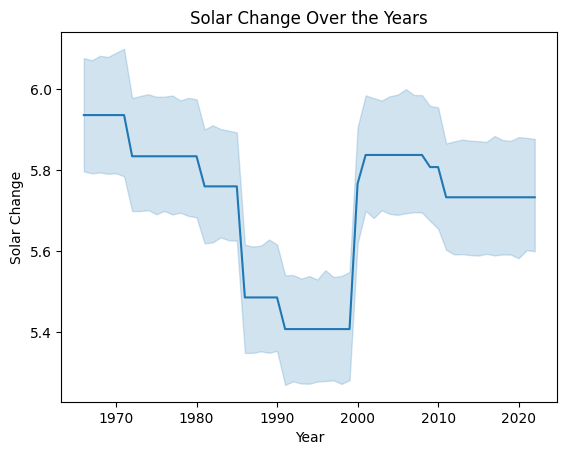

In [213]:
# Visualize the production of solar energy relationship between 'Year' and 'Solar Change'
sns.lineplot(x='Year', y='Solar Change', data=final_merged_df)
plt.title('Solar Change Over the Years')
plt.xlabel('Year')
plt.ylabel('Solar Change')
plt.show()

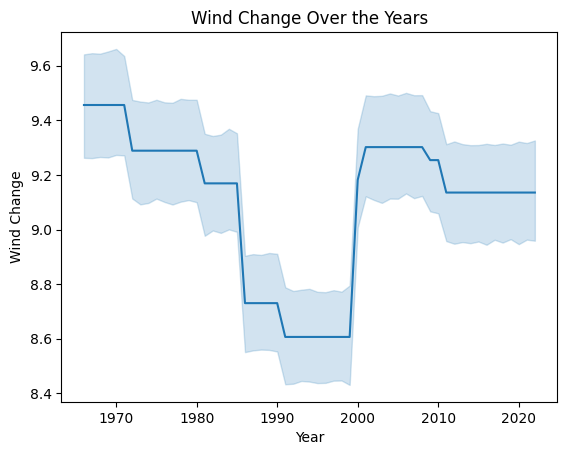

In [214]:
# Visualize the generation of wind energy relationship between 'Year' and 'Wind Change'
sns.lineplot(x='Year', y='Wind Change', data=final_merged_df)
plt.title('Wind Change Over the Years')
plt.xlabel('Year')
plt.ylabel('Wind Change')
plt.show()

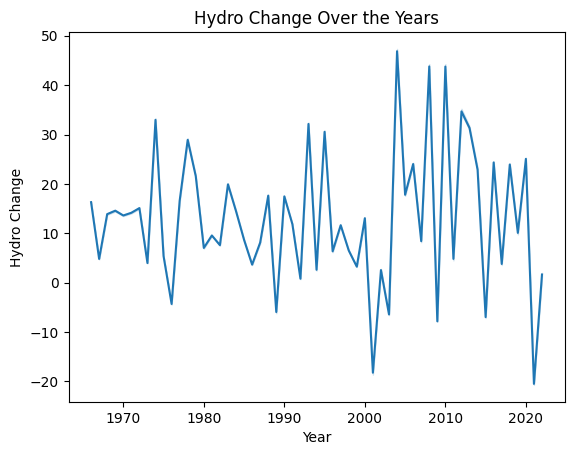

In [215]:
# Visualize the  generation of hydro energy relationship between 'Year' and 'Hydro Change'
sns.lineplot(x='Year', y='Hydro Change', data=final_merged_df)
plt.title('Hydro Change Over the Years')
plt.xlabel('Year')
plt.ylabel('Hydro Change')
plt.show()

--> Chart shows there are many up downs in the non_fossil fuel generation. They are not generated in stable way.

In [216]:
# investment in non-fossil technology
invest_renewable_energy =pd.read_csv('https://github.com/rashmi-22-stack/Final_Assignment/raw/main/investment-in-renewable-energy-by-technology.csv')
invest_renewable_energy.columns

Index(['Entity', 'Code', 'Year', 'Marine energy', 'Small hydropower',
       'Geothermal energy', 'Biofuels', 'Biomass and waste-to-energy',
       'Wind energy', 'Solar energy'],
      dtype='object')

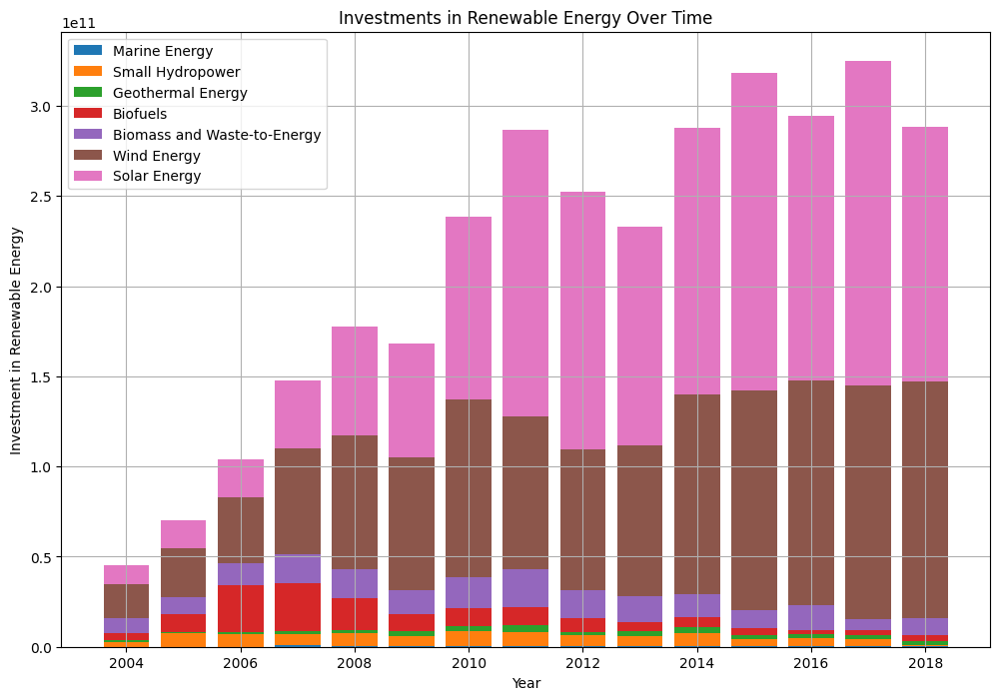

In [217]:
# Extract the relevant columns for investments and years
years = invest_renewable_energy['Year']
marine_energy = invest_renewable_energy['Marine energy']
small_hydropower = invest_renewable_energy['Small hydropower']
geothermal_energy = invest_renewable_energy['Geothermal energy']
biofuels = invest_renewable_energy['Biofuels']
biomass_waste_to_energy = invest_renewable_energy['Biomass and waste-to-energy']
wind_energy = invest_renewable_energy['Wind energy']
solar_energy = invest_renewable_energy['Solar energy']

# Create a figure and plot the data
plt.figure(figsize=(12, 8))
plt.bar(years, marine_energy, label='Marine Energy')
plt.bar(years, small_hydropower, label='Small Hydropower', bottom=marine_energy)
plt.bar(years, geothermal_energy, label='Geothermal Energy', bottom=marine_energy + small_hydropower)
plt.bar(years, biofuels, label='Biofuels', bottom=marine_energy + small_hydropower + geothermal_energy)
plt.bar(years, biomass_waste_to_energy, label='Biomass and Waste-to-Energy', bottom=marine_energy + small_hydropower + geothermal_energy + biofuels)
plt.bar(years, wind_energy, label='Wind Energy', bottom=marine_energy + small_hydropower + geothermal_energy + biofuels + biomass_waste_to_energy)
plt.bar(years, solar_energy, label='Solar Energy', bottom=marine_energy + small_hydropower + geothermal_energy + biofuels + biomass_waste_to_energy + wind_energy)

plt.xlabel('Year')
plt.ylabel('Investment in Renewable Energy')
plt.title('Investments in Renewable Energy Over Time')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

--> Renewable energy sources include hydropower, solar, wind, geothermal, bioenergy, wave,
and tidal. They don't include traditional biofuels, which can be a key energy source,
especially in lower-income countries.

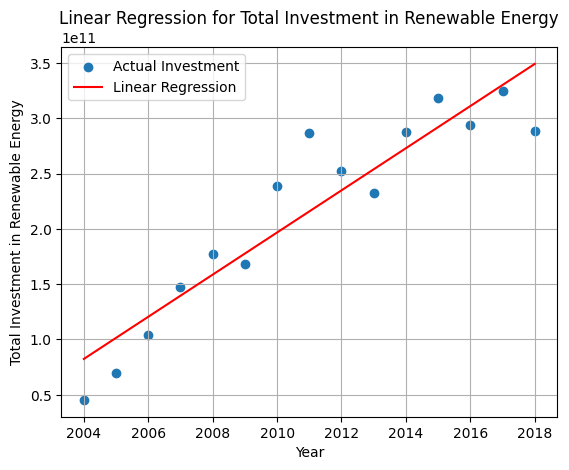

In [218]:
# calculating linearRgression
# Extract the relevant columns for investments and years
years = invest_renewable_energy['Year']
total_investment = (
    invest_renewable_energy['Marine energy']
    + invest_renewable_energy['Small hydropower']
    + invest_renewable_energy['Geothermal energy']
    + invest_renewable_energy['Biofuels']
    + invest_renewable_energy['Biomass and waste-to-energy']
    + invest_renewable_energy['Wind energy']
    + invest_renewable_energy['Solar energy']
)

# Create a linear regression model
model = LinearRegression()

# Reshape years to a 2D array for fitting the model
years_2d = years.values.reshape(-1, 1)

# Fit the model
model.fit(years_2d, total_investment)

# Make predictions using the model
predicted_investment = model.predict(years_2d)

# Create a scatter plot of the actual data points
plt.scatter(years, total_investment, label='Actual Investment')

# Plot the linear regression line
plt.plot(years, predicted_investment, color='red', label='Linear Regression')

plt.xlabel('Year')
plt.ylabel('Total Investment in Renewable Energy')
plt.title('Linear Regression for Total Investment in Renewable Energy')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

#Question 3. Which non-fossil fuel energy technology will have the best price in the future?

Answer:*  <font color='orange'>By analysing all above datas top-3 NON-Fossil fuels are having competiting in each aspect of generating , consuming and change in their generation . Top-3 non-fossil fuels are **Solar, Wind, Hydropower** . In spite of more generation and consumption of Hydro Energy there are very changes in generating it over years. From Investment chart its very obvious that in future will more attention and production of Solar Energy. Then definitely Solar Energy will have most chances to provide good Price in future.

The cost-effectiveness of these technologies will also depend on regional factors, such as local resource availability, energy policies, and incentives. It's important to note that the best choice of technology may vary from one location to another.

To make a more precise prediction about the future cost-effectiveness of non-fossil fuel energy technologies, it's essential to consult industry experts, follow energy market trends, and consider specific regional factors and policies that may influence these technologies.  (eind opdracht. Thanks :)